In [1]:
# import necessary python libraries
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily
pd.set_option("display.max_columns", 150)
import datetime
import seaborn as sns
import requests
import json
import urllib

In [2]:
# import NJ datasets
newark_deeds= pd.read_csv("data/SR1A_deeds/0714monm184546.csv", low_memory=False)



In [3]:
# looking at top 5 rows of deeds dataset
newark_deeds.head()

,Municipality,Grantor's Name (Seller),Grantor's Mailing Address,Grantor's City/State/Zip,Grantee's Name (Buyer),Grantee's Mailing Address,Grantee's City/State/Zip,Property Location,Block,Lot,Qual,Property Class,Land Assmnt,Building Assmnt,Total Assmnt,Recorded Date,Deed Date,Book,Page,Sale Price,NU Code,Sq. Ft.,Cl. 4 Use,SR1A #,Yr. Built,StyDesc,Style,Latitude,Longitude
0,714,"RUELA,ANTONIO J & MARIA",27,RIDGE ST,NEWARK NJ 071040000,"RODRIGUEZ,JORGE L & MERCE",271 RIDGE ST,2,557,56,NaN,0,1994,1900,8200,0000-00-00,10/12/94,5335,899,392.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN,0.0,0.0
1,714,"ESTER,CLEO RICHARD",8,NORTH 13TH STREET,NEWARK NJ 071070000,"GOOLCHARRAN,B Y A & H",442 ROSEVILLE AVE,2,1956,7,NaN,0,1994,3300,12200,0000-00-00,7/11/94,5321,727,490.0,11.0,0.0,NaN,0.0,0.0,NaN,NaN,0.0,0.0
2,714,"SMITH,DAVID Y",11 OLD FARM ROAD,NO CALDWELL NJ 07006,HANFORD STREET GRUST,PO BOX 726,UPPER MONTCLAIR NJ 07043,39-4,375,43,NaN,2,1993,6000,22300,0000-00-00,2/17/93,5249,65,1.0,0.0,0.0,NaN,25.0,0.0,NaN,NaN,0.0,0.0
3,714,"VANDYKE JR,GEORGE ADM",15 SCHUYLER AVE,NEWARK NJ 00000,"VANDYKE JR,GEORGE",15 SCHUYLER AVE,NEWARK NJ 00000,13-,3614,41,NaN,2,1992,2500,9200,0000-00-00,11/5/92,5236,848,1.0,0.0,0.0,NaN,10.0,0.0,NaN,NaN,0.0,0.0
4,714,K HOVNANIAN AT NEWARK URBAN RENEWAL,NaN,0 HGWY 35 PO BOX 500,RED BANK NJ 077010000,"LIN,JOE & CHUEN C",33 BOSTON CT,1,229,3.07,CA3G,0,1989,0,0,0000-00-00,2/17/89,5067,653,144.0,0.0,0.0,Y,26.0,0.0,NaN,NaN,0.0,0.0


In [4]:
# how many records are in the deeds dataset?
newark_deeds.shape

(129053, 29)

In [5]:
# what are the unique values for the property class field?
newark_deeds['Property Class'].unique()

array(['0', '2', '4', '1', '15', '4C', '5C', '4A', '4B', '5D', '5A', '5F',
       '5B', '100000', '47000', '90400', '2400', '38000', '3A', '111200'],
      dtype=object)

## Converting Deed Date field to datetime


In [6]:
deed_date = newark_deeds["Deed Date"].str.split("/", n = 2, expand = True)

In [7]:
# converting values with more than 2 characters to None
deed_date['month'] = np.where((deed_date[0].str.len()>2),None,deed_date[0])
deed_date['day'] = np.where((deed_date[1].str.len()>2),None,deed_date[1])
deed_date['year'] = np.where((deed_date[2].str.len()>2),None,deed_date[2])

# formatting day and month columns to be zero padded values 
deed_date['day'] = deed_date['day'].str.zfill(2)
deed_date['month'] = deed_date['month'].str.zfill(2)

In [8]:
# creating a single date column
deed_date['deed_date_cl'] =  deed_date['month'] + "/" + deed_date['day'] + "/" + deed_date['year']


In [9]:
# adding the newly formatted date column back into the newark_deeds dataframe
newark_deeds['deed_date_cl'] = deed_date['deed_date_cl']

In [10]:
newark_deeds.head()

,Municipality,Grantor's Name (Seller),Grantor's Mailing Address,Grantor's City/State/Zip,Grantee's Name (Buyer),Grantee's Mailing Address,Grantee's City/State/Zip,Property Location,Block,Lot,Qual,Property Class,Land Assmnt,Building Assmnt,Total Assmnt,Recorded Date,Deed Date,Book,Page,Sale Price,NU Code,Sq. Ft.,Cl. 4 Use,SR1A #,Yr. Built,StyDesc,Style,Latitude,Longitude,deed_date_cl
0,714,"RUELA,ANTONIO J & MARIA",27,RIDGE ST,NEWARK NJ 071040000,"RODRIGUEZ,JORGE L & MERCE",271 RIDGE ST,2,557,56,NaN,0,1994,1900,8200,0000-00-00,10/12/94,5335,899,392.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN,0.0,0.0,10/12/94
1,714,"ESTER,CLEO RICHARD",8,NORTH 13TH STREET,NEWARK NJ 071070000,"GOOLCHARRAN,B Y A & H",442 ROSEVILLE AVE,2,1956,7,NaN,0,1994,3300,12200,0000-00-00,7/11/94,5321,727,490.0,11.0,0.0,NaN,0.0,0.0,NaN,NaN,0.0,0.0,07/11/94
2,714,"SMITH,DAVID Y",11 OLD FARM ROAD,NO CALDWELL NJ 07006,HANFORD STREET GRUST,PO BOX 726,UPPER MONTCLAIR NJ 07043,39-4,375,43,NaN,2,1993,6000,22300,0000-00-00,2/17/93,5249,65,1.0,0.0,0.0,NaN,25.0,0.0,NaN,NaN,0.0,0.0,02/17/93
3,714,"VANDYKE JR,GEORGE ADM",15 SCHUYLER AVE,NEWARK NJ 00000,"VANDYKE JR,GEORGE",15 SCHUYLER AVE,NEWARK NJ 00000,13-,3614,41,NaN,2,1992,2500,9200,0000-00-00,11/5/92,5236,848,1.0,0.0,0.0,NaN,10.0,0.0,NaN,NaN,0.0,0.0,11/05/92
4,714,K HOVNANIAN AT NEWARK URBAN RENEWAL,NaN,0 HGWY 35 PO BOX 500,RED BANK NJ 077010000,"LIN,JOE & CHUEN C",33 BOSTON CT,1,229,3.07,CA3G,0,1989,0,0,0000-00-00,2/17/89,5067,653,144.0,0.0,0.0,Y,26.0,0.0,NaN,NaN,0.0,0.0,02/17/89


In [11]:
# create a new column with the 
newark_deeds['deed_date_dt'] = pd.to_datetime(newark_deeds['deed_date_cl'], format='%m/%d/%y')

In [12]:
newark_deeds['year'] = pd.DatetimeIndex(newark_deeds['deed_date_dt']).year

## Visualize deeds annually over time

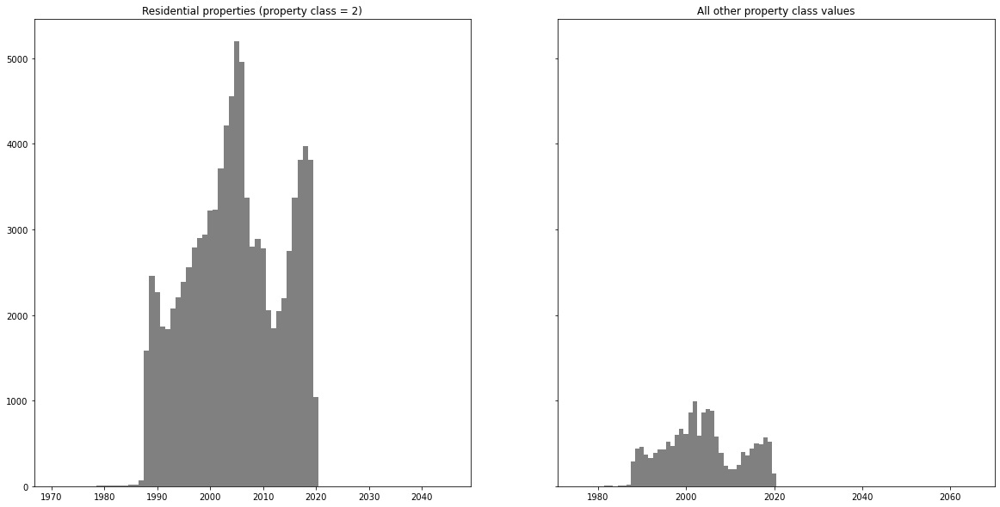

In [13]:
# format data to get count of deeds per year
total_annual_deeds = newark_deeds.groupby(['year','Property Class']).agg({'Deed Date':'count'})
total_annual_deeds_bar = total_annual_deeds.reset_index()

f, (ax2,ax1,) = plt.subplots(1,2,figsize=(20, 10),sharey=True)

ax1.bar(data=total_annual_deeds_bar[total_annual_deeds_bar["Property Class"]!='2'],x='year', 
            height='Deed Date',label='total purchases', color = 'grey',width=1)
ax1.title.set_text("All other property class values")

ax2.bar(data=total_annual_deeds_bar[total_annual_deeds_bar["Property Class"]=='2'],x='year', 
            height='Deed Date',label='total purchases', color = 'grey',width=1)
ax2.title.set_text("Residential properties (property class = 2)")

## Geocoding addresses with Census Geocoder API

Documentation for API is available [here](https://www.census.gov/programs-surveys/geography/technical-documentation/complete-technical-documentation/census-geocoder.html)

### Creating 1988-2021 subset for geocode with census api

In [14]:
deeds_1988_2021 = newark_deeds[(newark_deeds['year']>1988) & (newark_deeds['year']<2021)].copy()
deeds_1988_2021[deeds_1988_2021["Property Class"]=='2'].shape

(94097, 32)

In [15]:
deeds_1988_2021_residential = deeds_1988_2021[deeds_1988_2021["Property Class"]=='2'].copy()

## Census geocoder batch
Formatting data to be used with batch census geocoder method 

In [16]:
# creating city and state fields 
deeds_1988_2021_residential['city'] = "Newark"
deeds_1988_2021_residential['state'] = "NJ"
deeds_1988_2021_residential['zip'] = ""

In [17]:
# format dataframe with just necessary columns for batch geocoder
deeds_1988_2021_residential_csv = deeds_1988_2021_residential.filter(['SR1A #','Property Location','city','state','zip'])

# subset dataframe into 10000 row groups to meet batch geocoder limit
deeds_1988_2021_residential_csv_1_10000 = deeds_1988_2021_residential_csv.iloc[:10000]
deeds_1988_2021_residential_csv_10001_20000 = deeds_1988_2021_residential_csv.iloc[10000:20000]
deeds_1988_2021_residential_csv_20001_30000 = deeds_1988_2021_residential_csv.iloc[20000:30000]
deeds_1988_2021_residential_csv_30001_40000 = deeds_1988_2021_residential_csv.iloc[30000:40000]
deeds_1988_2021_residential_csv_40001_50000 = deeds_1988_2021_residential_csv.iloc[40000:50000]

deeds_1988_2021_residential_csv_50001_60000 = deeds_1988_2021_residential_csv.iloc[50000:60000]
deeds_1988_2021_residential_csv_60001_70000 = deeds_1988_2021_residential_csv.iloc[60000:70000]
deeds_1988_2021_residential_csv_70001_80000 = deeds_1988_2021_residential_csv.iloc[70000:80000]
deeds_1988_2021_residential_csv_80001_90000 = deeds_1988_2021_residential_csv.iloc[80000:90000]
deeds_1988_2021_residential_csv_90001_100000 = deeds_1988_2021_residential_csv.iloc[90000:100000]


In [18]:
# export individual address files to csv for batch geocoder 
# without header to not exceed 10000 rows in the output csv file
deeds_1988_2021_residential_csv_1_10000.to_csv(
    'data/process/deeds88_21_1_10000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_10001_20000.to_csv(
    'data/process/deeds88_21_10001_20000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_20001_30000.to_csv(
    'data/process/deeds88_21_20001_30000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_30001_40000.to_csv(
    'data/process/deeds88_21_30001_40000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_40001_50000.to_csv(
    'data/process/deeds88_21_40001_50000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_50001_60000.to_csv(
    'data/process/deeds88_21_50001_60000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_60001_70000.to_csv(
    'data/process/deeds88_21_60001_70000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_70001_80000.to_csv(
    'data/process/deeds88_21_70001_80000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_80001_90000.to_csv(
    'data/process/deeds88_21_80001_90000.csv',index=False, header=False)
deeds_1988_2021_residential_csv_90001_100000.to_csv(
    'data/process/deeds88_21_90001_100000.csv',index=False, header=False)

## Batch script

Run this via terminal -- update for each batch of 10000 addresses
```curl --form addressFile=@deeds88_21_10001_20000.csv --form benchmark=2020 https://geocoding.geo.census.gov/geocoder/locations/addressbatch --output geocoderesult10001_20000.csv```

## Checking results of batch geocode
reading in results from batch geocode & checking for missing/non exact matches

In [19]:
geocoder_results_columns = ['RecordID',
                            'InputAddress',
                            'Match Indicator',
                            'MatchType',
                            'TIGER_output_address',
                            'lat_lng',
                            'TIGER_lineID',
                            'TIGER_lineID_side',
                            'State',
                            'Cnty',
                            'Tract',
                            'Block'
                           ]

In [20]:
# reading in all results files
results1_10000 = pd.read_csv('data/geo_code_results/geocoderesult1_10000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results10001_20000 = pd.read_csv('data/geo_code_results/geocoderesult10001_20000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results20001_30000 = pd.read_csv('data/geo_code_results/geocoderesult20001_30000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results30001_40000 = pd.read_csv('data/geo_code_results/geocoderesult30001_40000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results400001_50000 = pd.read_csv('data/geo_code_results/geocoderesult40001_50000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results500001_60000 = pd.read_csv('data/geo_code_results/geocoderesult50001_60000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results60001_70000 = pd.read_csv('data/geo_code_results/geocoderesult60001_70000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results70001_80000 = pd.read_csv('data/geo_code_results/geocoderesult70001_80000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results80001_90000 = pd.read_csv('data/geo_code_results/geocoderesult80001_90000.csv', 
                             header = None, 
                             names=geocoder_results_columns)
results90001_100000 = pd.read_csv('data/geo_code_results/geocoderesult80001_90000.csv', 
                             header = None, 
                             names=geocoder_results_columns)

In [21]:
census_results_geo = pd.concat([results1_10000,
                            results10001_20000,
                            results20001_30000,
                            results30001_40000,
                            results400001_50000,
                            results500001_60000,
                            results60001_70000,
                            results70001_80000,
                            results80001_90000,
                            results90001_100000], ignore_index=True)

In [22]:
dup_census = census_results_geo.groupby('RecordID').filter(lambda x: len(x) >1)

In [37]:
# removing duplicates (unclear why these were introduced by the geocoder...)
census_res_geo_no_dup = census_results_geo.drop_duplicates()
census_res_geo_no_dup = census_res_geo_no_dup.drop(columns = ['State','Cnty','Tract','Block']).copy()

In [38]:
# splitting coordinates column to create geodataframe
census_res_geo_no_dup[['lng','lat']]=census_res_geo_no_dup['lat_lng'].str.split(",", expand=True).copy()

In [39]:
# merge with residential deeds results
deeds_census_geo = deeds_1988_2021_residential.merge(census_res_geo_no_dup,
                                                          left_on='SR1A #', 
                                                          right_on='RecordID', 
                                                          how='left')

## Google API for non-matched addresses
Running the Google API for all remaining non-matched addresses (focusing on 2000-2021)

In [41]:
# filtering for short addresses 
deeds_census_geo['addr_len'] = deeds_census_geo['Property Location'].str.len()

In [42]:
# filtering for post 2000 deeds to reduce # query results 
deeds_00_21 = deeds_census_geo[deeds_census_geo['year']>1999].copy()

In [43]:
deeds_88_99 = deeds_census_geo[deeds_census_geo['year']<1999].copy()

In [48]:
deeds_forgoogle88_99 = deeds_88_99[(deeds_88_99['addr_len']>8) & (deeds_88_99['MatchType']!='Exact')].shape

In [ ]:
# dataframe with all records for which there is no usable address
no_address00_21 = deeds_00_21[(deeds_00_21['addr_len']>8)]

# dataframe to use for google api query
deeds_forgoogle00_21 = deeds_00_21[(deeds_00_21['addr_len']>8) & (deeds_00_21['MatchType']!='Exact')].copy()

In [49]:
# comment these out when finished so API key doesnn't accidentally run

api = open(r"API-KEY.txt",)
api_KEY = api.read()


In [50]:
# function to use the google geocoder API 
# with a dataframe with a field of only street addresses (no city/st)

# dataframe : pandas DataFrame with address field
# address_field: str --> string for column name containing addresses
# id_field: str --> column name for unique ID field
# city_st : str --> 'City Name, ST' City name + state with comma between ('Newark,NJ')
# apikey: str --> api key for google geocoder api (be aware of billing requirements)

def googlequery(dataframe,addressfield,id_field,cityst,apikey):
    GOOGLE_MAPS_API_URL = 'https://maps.googleapis.com/maps/api/geocode/json'
    city_st= cityst
    lat_list = []
    lng_list = []
    id_list = []

    for index, row in dataframe.iterrows():
        address_df = row[addressfield]
        id_list.append(row[id_field])
        params = {
            'address': '{}{}'.format(address_df,city_st),
            'key': api_KEY
        }
        req = requests.get(GOOGLE_MAPS_API_URL, params=params)
        
        if req.status_code == requests.codes.ok:  
            res = req.json()
            result = res['results'][0]
            lat_list.append(result['geometry']['location']['lat'])
            lng_list.append(result['geometry']['location']['lng'])
    #         print(row['SR1A #'])
        else:
            print(req.status_code)
            print("nope")
            lat_list.append(np.nan)
            lng_list.append(np.nan)
    coords_google = pd.DataFrame({'id': id_list,
        'lat': lat_list,
        'lng': lng_list})
    
    return coords_google


In [ ]:
# dividing into groups to check charges
deeds_forgoogle00_21 = deeds_forgoogle00_21.reset_index()
deeds_forgoogle00_21_batch001 = deeds_forgoogle00_21.iloc[:1000]
deeds_forgoogle00_21_batch002 = deeds_forgoogle00_21.iloc[1000:]


In [ ]:
deeds_forgoogle00_21_batch001_results = googlequery(deeds_forgoogle00_21_batch001,"Property Location","SR1A #", "Newark,NJ",api_KEY)

In [ ]:
deeds_forgoogle00_21_batch002_results = googlequery(deeds_forgoogle00_21_batch002,"Property Location","SR1A #", "Newark,NJ",api_KEY)

In [ ]:
# merging together
deeds_google_results = pd.concat([deeds_forgoogle00_21_batch001_results,deeds_forgoogle00_21_batch002_results],ignore_index=True)

In [ ]:
deeds_google_results.to_csv("data/geo_code_results/SR1A_deeds/google_results00_21.csv")

In [52]:
deeds_google_results = pd.read_csv("data/geo_code_results/SR1A_deeds/google_results00_21.csv")

In [53]:
deeds_google_results.head(3)

,Unnamed: 0,id,lat,lng
0,0,5696846.0,40.746513,-74.206904
1,1,5696847.0,40.780528,-74.169891
2,2,5696838.0,40.762223,-74.169067


## merging google results with census geocode results

In [113]:
deeds00_21_geo = deeds_00_21.merge(deeds_google_results, left_on="SR1A #", right_on="id", how='left')

In [114]:
# dropping blank lat/lon column from deeds data 
deeds00_21_geo = deeds00_21_geo.drop(['Latitude','Longitude'],axis=1)

In [115]:
# combining geocode results into final list of lat/lng coordinates

deeds00_21_geo['latitude_result'] = deeds00_21_geo.apply(lambda x: x['lat_x'] if (x['MatchType'] == 'Exact') else x['lat_y'], axis=1).astype('float')

deeds00_21_geo['longitude_result'] = deeds00_21_geo.apply(lambda x: x['lng_x'] if (x['MatchType'] == 'Exact') else x['lng_y'], axis=1).astype('float')

In [116]:
# 40.7070685, -74.2073749 1655568.0
# manual correction for one address result
deeds00_21_geo['longitude_result'][30746] = -74.2073749
deeds00_21_geo['latitude_result'][30746] = 40.7070685

/Users/darebrawley/anaconda3/envs/geo-2021/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/darebrawley/anaconda3/envs/geo-2021/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [120]:
# converting to geodataframe
deeds00_21_geo_gdf = gpd.GeoDataFrame(deeds00_21_geo, 
        geometry=gpd.points_from_xy(deeds00_21_geo.longitude_result,deeds00_21_geo.latitude_result))

<AxesSubplot:>

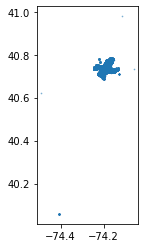

In [123]:
deeds00_21_geo_gdf.plot(markersize=0.5, alpha=0.5)

In [124]:
# bringing in newark wards to select only newark addresses 
wards = gpd.read_file('data/newark_wards/Wards_2012.shp')

In [130]:
# reprojecting 
deeds00_21_geo_gdf = deeds00_21_geo_gdf.set_crs('epsg:4326')
deeds00_21_geo_gdf = deeds00_21_geo_gdf.to_crs('epsg:3424')


In [164]:
deeds00_21_within_newark = gpd.sjoin(deeds00_21_geo_gdf,wards[['MUNCOUNTY','geometry']],how='left', op='within')

In [165]:
# selecting just those deeds within newark
# lose a total of 473 deeds (<1% of total deeds from 2000-2021)
deeds00_21_within_newark = deeds00_21_within_newark[(join_left.MUNCOUNTY.notnull())&(join_left.addr_len>1)].copy()

In [167]:
# dropping unnecessary columns for cleaner dataset
deeds00_21_within_newark = deeds00_21_within_newark.drop(['InputAddress', 'Match Indicator', 'MatchType',
       'TIGER_output_address', 'lat_lng', 'TIGER_lineID', 'TIGER_lineID_side',
       'lng_x', 'lat_x', 'addr_len', 'Unnamed: 0.1', 'id', 'lat_y', 'lng_y','index_right',
       'MUNCOUNTY'],axis=1)

In [174]:
# converting back to wgs 84 for save
deeds00_21_within_newark = deeds00_21_within_newark.to_crs('epsg:4326')

In [175]:
deeds00_21_within_newark.to_csv("data/SR1A_deeds/deeds00_21_geocoded.csv")
deeds00_21_geo_fromcsv = pd.read_csv("data/SR1A_deeds/deeds00_21_geocoded.csv",low_memory=False)

In [179]:
deeds00_21_geo_clean = gpd.GeoDataFrame(deeds00_21_geo_fromcsv, 
    geometry=gpd.points_from_xy(deeds00_21_geo_fromcsv.longitude_result,deeds00_21_geo_fromcsv.latitude_result))

<AxesSubplot:>

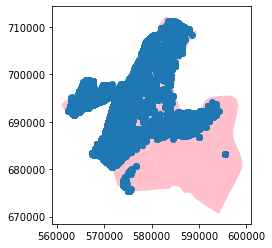

In [184]:
# deeds00_21_geo_clean.set_crs('epsg:4326').to_crs('epsg:3424')
base = wards.plot(color='pink')
deeds00_21_geo_clean.set_crs('epsg:4326').to_crs('epsg:3424').plot(ax=base)